In [1]:
import pandas as pd
import pickle

county_galway = pd.read_csv("data/dly1875_galway-athenry.csv")
county_galway["date"] = pd.to_datetime(county_galway["date"])
county_galway = county_galway[(county_galway["date"].dt.year >= 2013) & (county_galway["date"].dt.year <= 2023)]


In [2]:
county_galway = county_galway.loc[:, ~county_galway.columns.str.startswith(('ind', 'file','igmin'))]

In [3]:
county_galway.dtypes

date      datetime64[ns]
maxtp            float64
mintp            float64
gmin              object
rain              object
cbl               object
wdsp              object
hm                 int64
ddhm              object
hg                 int64
soil              object
pe                object
evap              object
smd_wd            object
smd_md            object
smd_pd            object
glorad            object
dtype: object

In [4]:
county_galway= county_galway.replace(r'\s+', 777444, regex=True)


In [5]:
for column in county_galway.columns:
    # get the indices of the rows that contain 777444
    indices = county_galway[county_galway[column] == 777444].index.tolist()
    
    # get the date column values for those indices
    dates = county_galway.loc[indices, 'date'].tolist()
    
    # print the results
    print(f'The value of 777444 occurred {len(indices)} times in {column} on the following dates: {dates}.')

The value of 777444 occurred 0 times in date on the following dates: [].
The value of 777444 occurred 0 times in maxtp on the following dates: [].
The value of 777444 occurred 0 times in mintp on the following dates: [].
The value of 777444 occurred 3 times in gmin on the following dates: [Timestamp('2014-05-13 00:00:00'), Timestamp('2021-07-20 00:00:00'), Timestamp('2021-09-11 00:00:00')].
The value of 777444 occurred 1 times in rain on the following dates: [Timestamp('2021-09-11 00:00:00')].
The value of 777444 occurred 10 times in cbl on the following dates: [Timestamp('2014-06-26 00:00:00'), Timestamp('2014-06-27 00:00:00'), Timestamp('2015-06-22 00:00:00'), Timestamp('2015-06-23 00:00:00'), Timestamp('2015-10-16 00:00:00'), Timestamp('2015-10-17 00:00:00'), Timestamp('2015-10-18 00:00:00'), Timestamp('2015-10-19 00:00:00'), Timestamp('2021-07-20 00:00:00'), Timestamp('2021-09-11 00:00:00')].
The value of 777444 occurred 2 times in wdsp on the following dates: [Timestamp('2021-07-2

In [6]:
county_galway= county_galway.replace(777444,0, regex=True)

In [7]:
county_galway["date"] = pd.to_datetime(county_galway["date"])

In [8]:
county_galway[["glorad","hm","ddhm"]] = county_galway[["glorad","hm","ddhm"]].astype("int64")
columns_to_convert = ["gmin", "rain", "cbl", "wdsp", "soil", "pe", "evap", "smd_wd", "smd_md", "smd_pd"]
county_galway[columns_to_convert] = county_galway[columns_to_convert].astype(float)


In [9]:
with open("data/county_galwayrainfallamt.pkl", "wb") as f:
        pickle.dump(county_galway, f)

In [10]:
import pandas as pd
import pickle

with open("data/county_galwayrainfallamt.pkl", "rb") as f:
    county_galway = pickle.load(f)

In [11]:
print(county_galway.dtypes)

date      datetime64[ns]
maxtp            float64
mintp            float64
gmin             float64
rain             float64
cbl              float64
wdsp             float64
hm                 int64
ddhm               int64
hg                 int64
soil             float64
pe               float64
evap             float64
smd_wd           float64
smd_md           float64
smd_pd           float64
glorad             int64
dtype: object


In [12]:
len(county_galway)

4017

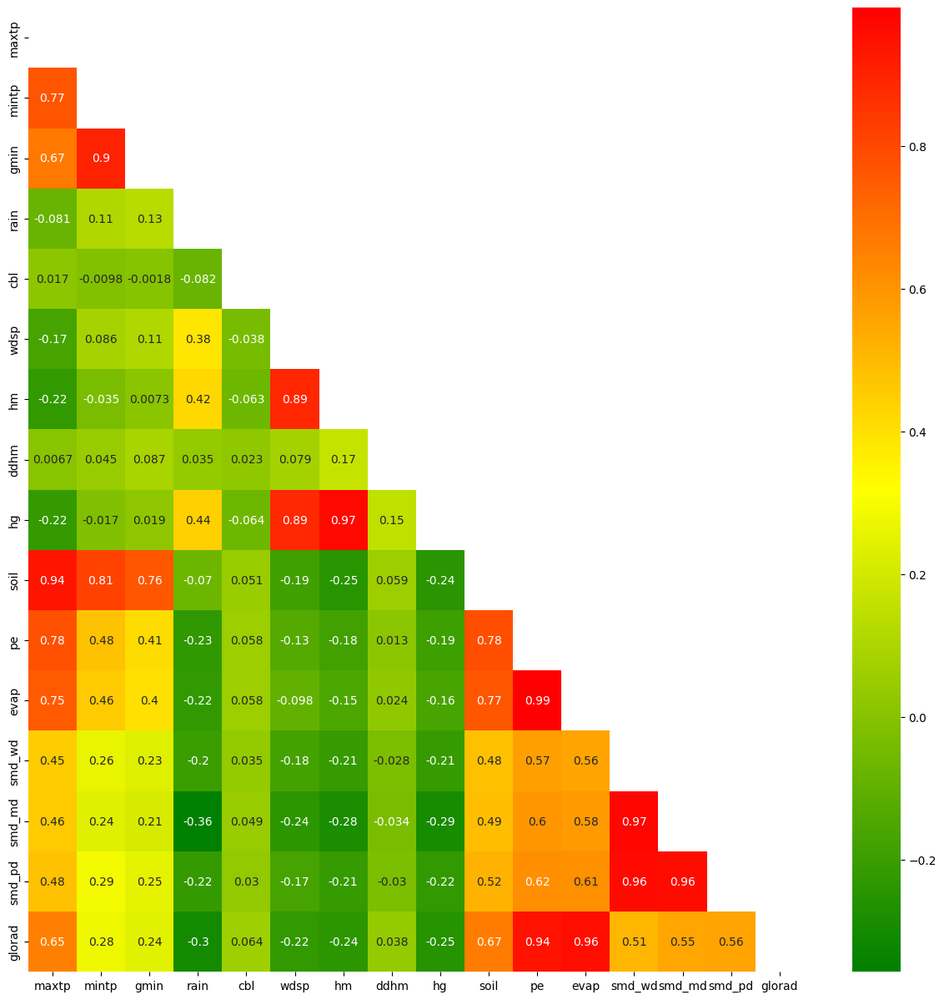

In [13]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Define the colors for the colormap
colors = ['green', 'yellow', 'red']

# Create the colormap
cmap = LinearSegmentedColormap.from_list('green_yellow_red', colors)

# Plot correlation matrix for numerical variables in shanon dataset except date,ind.5,ind.4,ind.3,ind.2,ind.1
num_cols = county_galway.select_dtypes(include="number").filter(regex='^(?!ind)').columns  
corr = county_galway[num_cols].corr(method="pearson")
plt.figure(figsize=(15, 15))
# Create a lower triangular heatmap
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True,cmap=cmap)
plt.savefig("westmeath_heatmap_pearson.png")

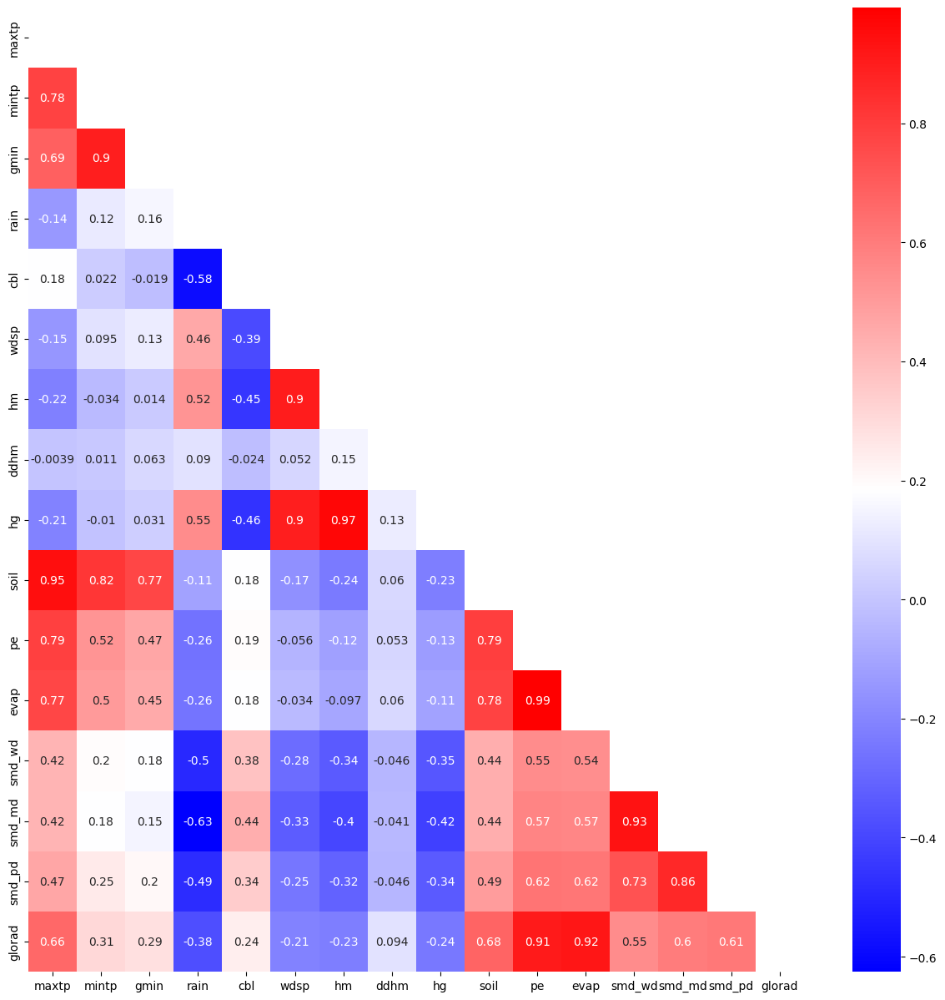

In [14]:
num_cols = county_galway.select_dtypes(include="number").filter(regex='^(?!ind)').columns     
corr = county_galway[num_cols].corr(method="spearman")
plt.figure(figsize=(15, 15))
# Create a lower triangular heatmap
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr, mask=mask, annot=True,cmap="bwr")
plt.savefig("westmeath_heatmap_spearman.png")

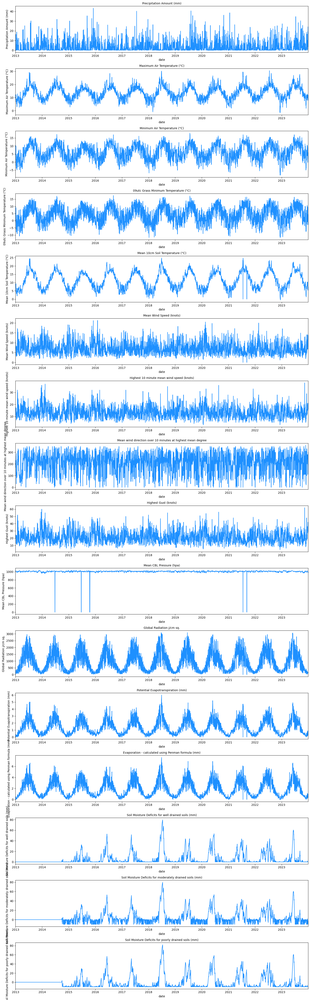

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import date
import numpy as np
import matplotlib.dates as mdates
features = {
    'rain': 'Precipitation Amount (mm)',
    'maxtp': 'Maximum Air Temperature (°C)',
    'mintp': 'Minimum Air Temperature (°C)',
    'gmin': '09utc Grass Minimum Temperature (°C)',
    'soil': 'Mean 10cm Soil Temperature (°C)',
    'wdsp': 'Mean Wind Speed (knots)',
    'hm': 'Highest 10 minute mean wind speed (knots)',
    'ddhm': 'Mean wind direction over 10 minutes at highest mean degree',
    'hg': 'Highest Gust (knots)',
    'cbl': 'Mean CBL Pressure (hpa)',
    'glorad':'Global Radiation j/cm sq.' ,
    'pe': 'Potential Evapotranspiration (mm)',
    'evap': 'Evaporation - calculated using Penman formula (mm)',
    'smd_wd': 'Soil Moisture Deficits for well drained soils (mm)',
    'smd_md': 'Soil Moisture Deficits for moderately drained soils (mm)',
    'smd_pd': 'Soil Moisture Deficits for poorly drained soils (mm)'
}

f, ax = plt.subplots(nrows=len(features), ncols=1, figsize=(15, 3*len(features))) 

for i, (feature, label) in enumerate(features.items()):
    sns.lineplot(x=county_galway.date, y=county_galway[feature].fillna(np.inf), ax=ax[i], color='dodgerblue')
    ax[i].set_title(f'{label}', fontsize=10)
    ax[i].set_ylabel(ylabel=label, fontsize=10)
    ax[i].set_xlim([date(2013, 1, 1), date(2023, 12, 31)])
    ax[i].xaxis.set_major_locator(mdates.YearLocator())  # Set major ticks location
    ax[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))  # Set major ticks format

plt.tight_layout()
plt.show()



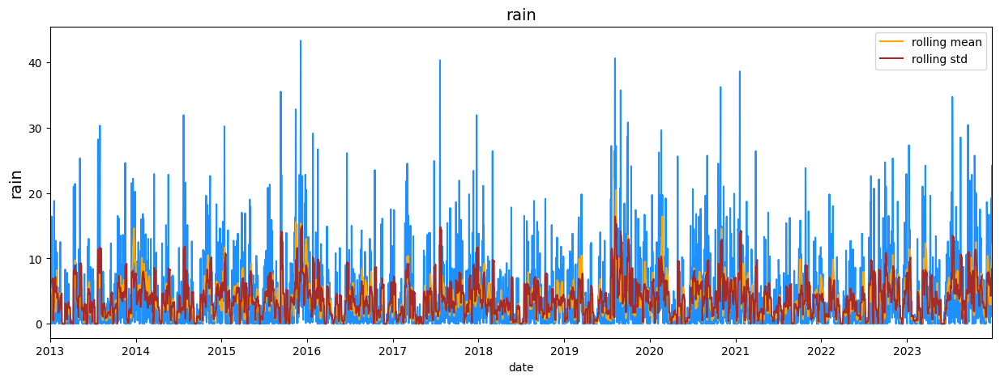

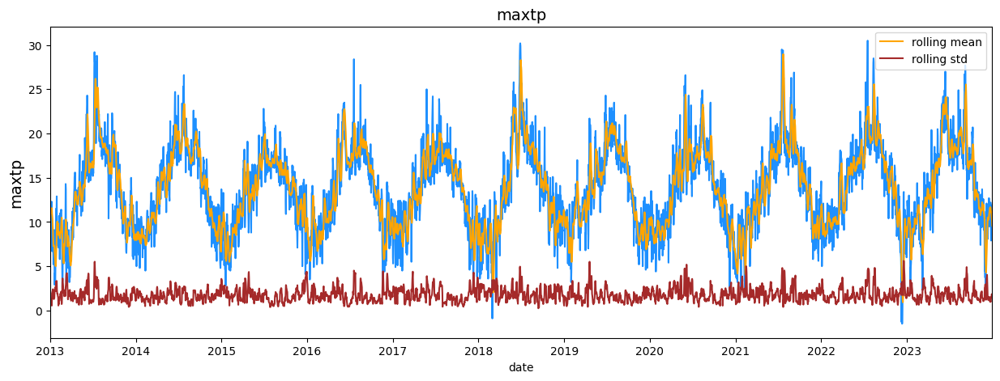

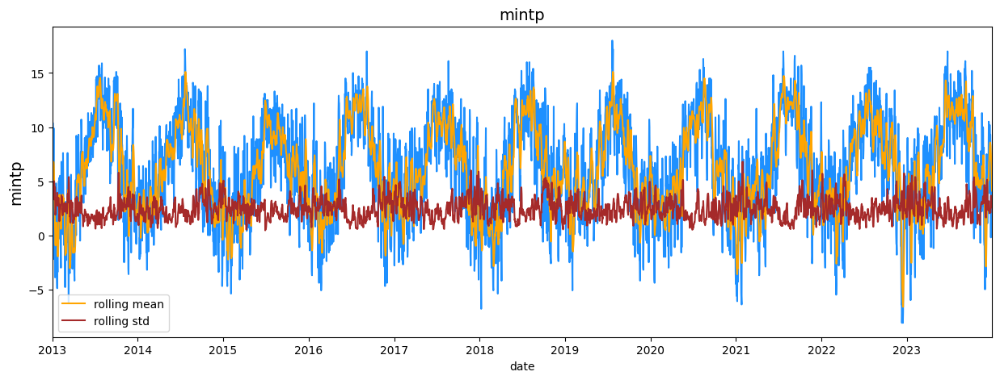

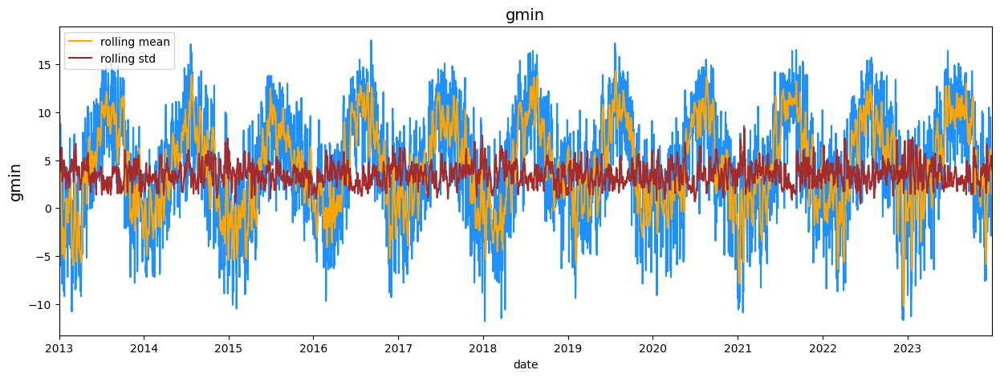

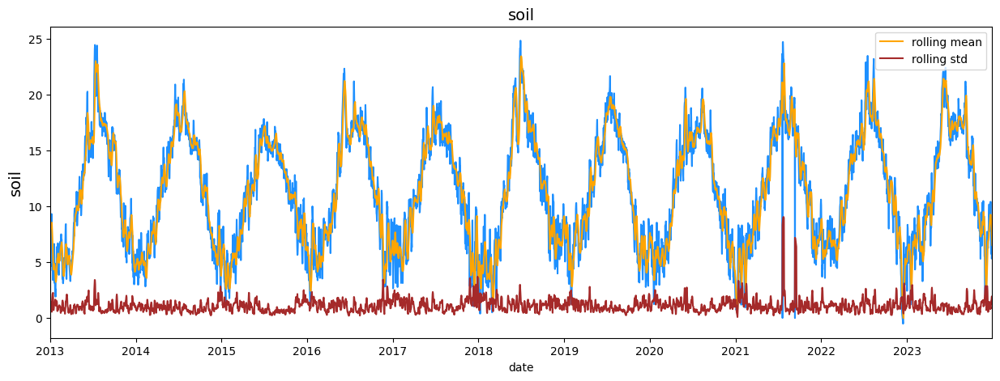

...

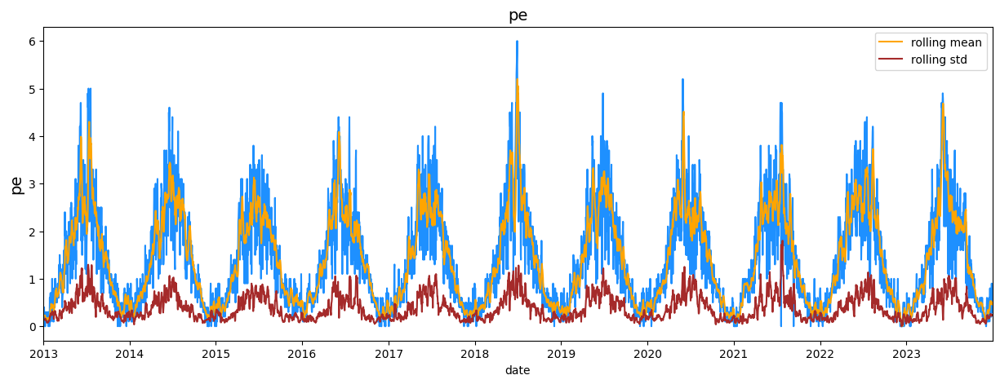

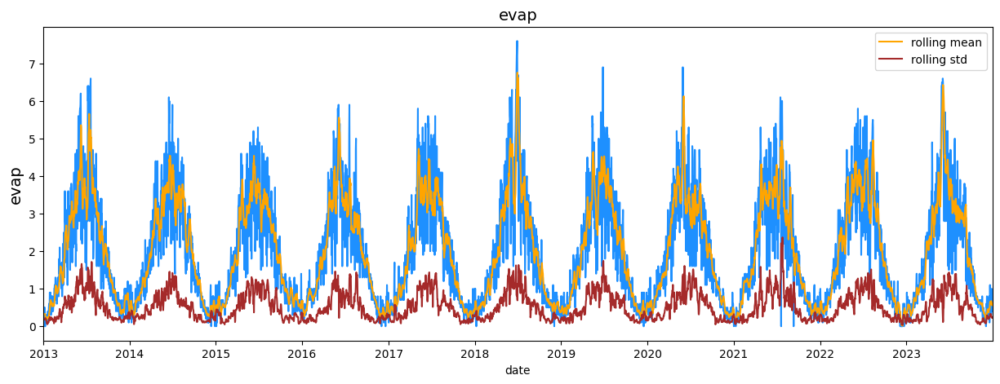

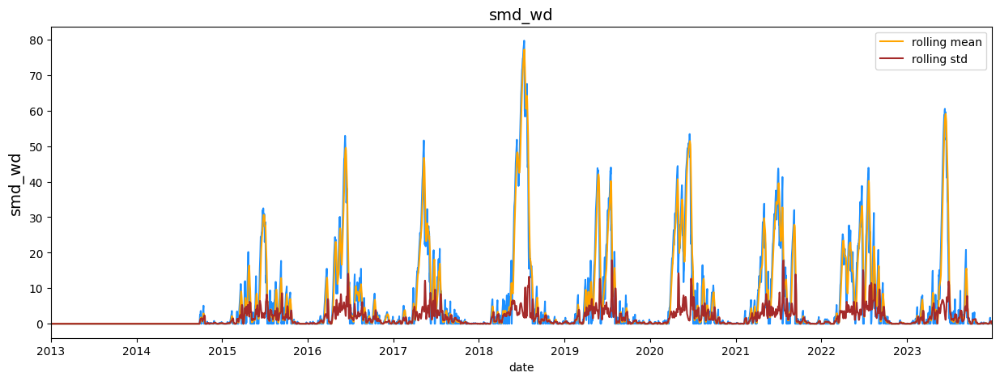

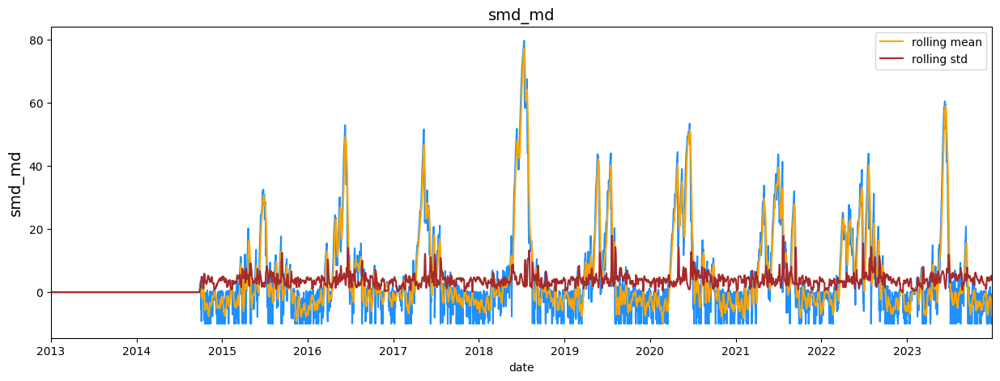

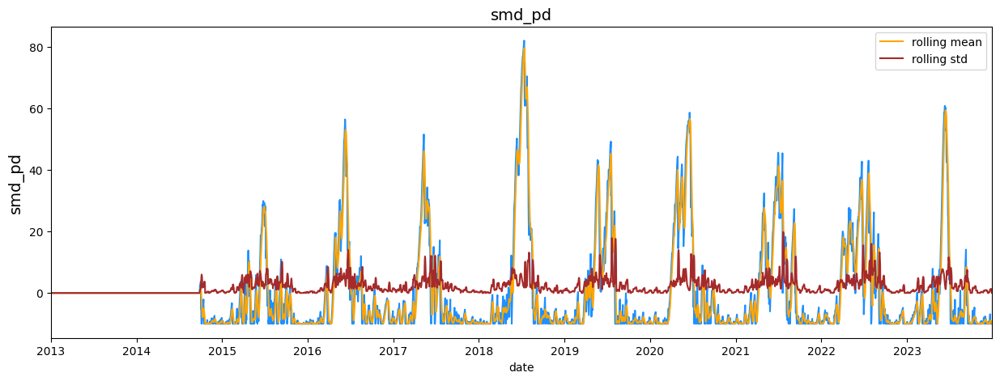

In [16]:
from datetime import date
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns

rolling_window = 7
features = ['rain','maxtp','mintp','gmin','soil','wdsp','hm','ddhm','hg','cbl','glorad','pe','evap','smd_wd','smd_md','smd_pd']

for feature in features:
    f, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 5))
    sns.lineplot(x=county_galway.date, y=county_galway[feature], ax=ax, color='dodgerblue')
    sns.lineplot(x=county_galway.date, y=county_galway[feature].rolling(rolling_window).mean(), ax=ax, color='#FFA500', label='rolling mean')
    sns.lineplot(x=county_galway.date, y=county_galway[feature].rolling(rolling_window).std(), ax=ax, color='brown', label='rolling std')
    ax.set_title(feature, fontsize=14)
    ax.set_ylabel(ylabel=feature, fontsize=14)
    ax.set_xlim([date(2013, 1, 1), date(2023, 12, 31)])
    ax.xaxis.set_major_locator(mdates.YearLocator())  # Set major ticks location
    plt.show()


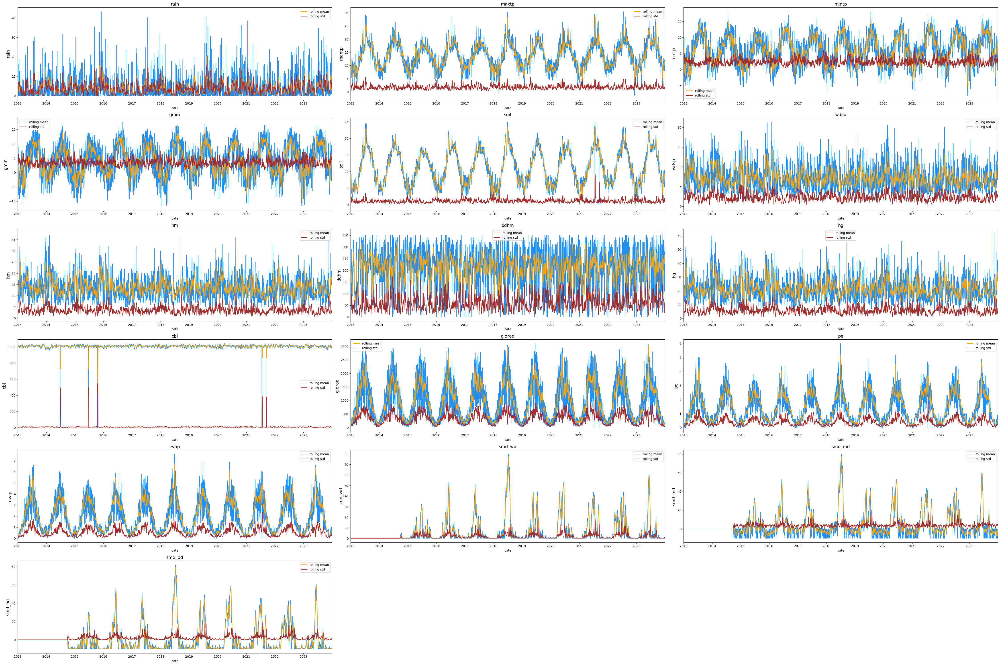

In [17]:
from datetime import date
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

rolling_window = 7
features = ['rain','maxtp','mintp','gmin','soil','wdsp','hm','ddhm','hg','cbl','glorad','pe','evap','smd_wd','smd_md','smd_pd']

# Calculate the number of rows needed for the plot
n = len(features)
n_cols = 3
n_rows = n // n_cols
n_rows += n % n_cols

# Create a figure with a size of 15x5 per subplot
fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15*n_cols, 5*n_rows))

# Flatten the axes for easy iteration
axs = axs.flatten()

for i, feature in enumerate(features):
    ax = axs[i]
    sns.lineplot(x=county_galway.date, y=county_galway[feature], ax=ax, color='dodgerblue')
    sns.lineplot(x=county_galway.date, y=county_galway[feature].rolling(rolling_window).mean(), ax=ax, color='#FFA500', label='rolling mean')
    sns.lineplot(x=county_galway.date, y=county_galway[feature].rolling(rolling_window).std(), ax=ax, color='brown', label='rolling std')
    ax.set_title(feature, fontsize=14)
    ax.set_ylabel(ylabel=feature, fontsize=14)
    ax.set_xlim([date(2013, 1, 1), date(2023, 12, 31)])
    ax.xaxis.set_major_locator(mdates.YearLocator())  # Set major ticks location

# Remove unused subplots
if n < n_rows * n_cols:
    for i in range(n, n_rows * n_cols):
        fig.delaxes(axs[i])

plt.tight_layout()
plt.show()


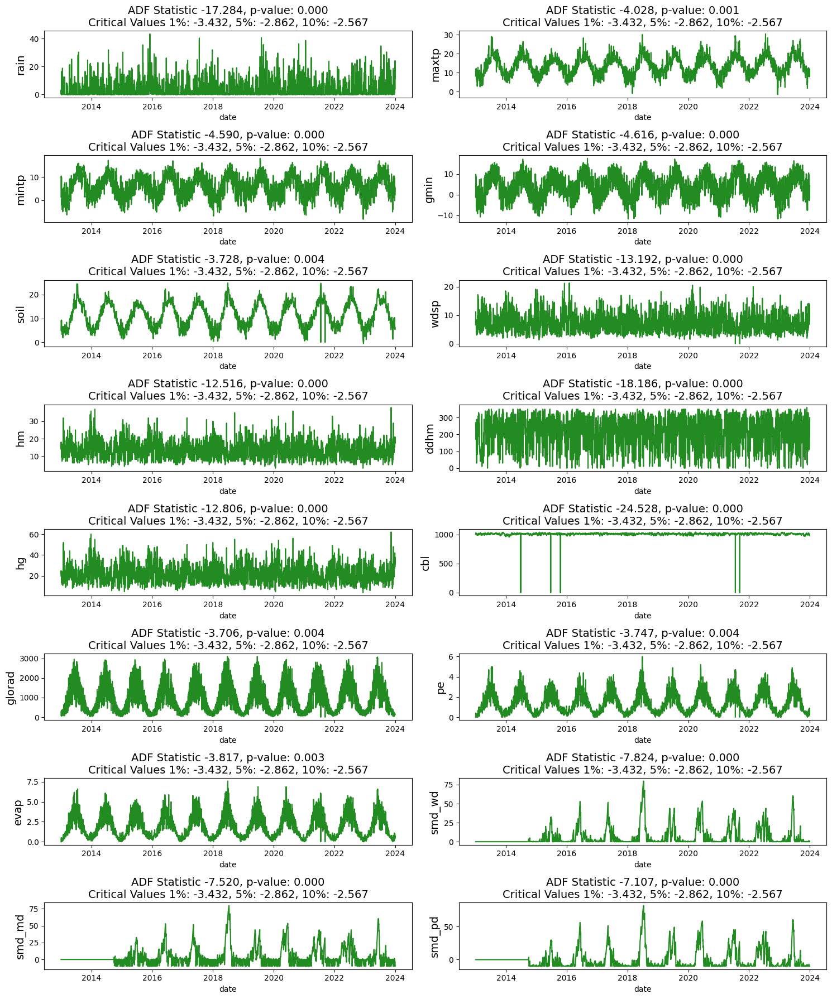

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import date
import matplotlib.dates as mdates
from statsmodels.tsa.stattools import adfuller
fields = ['rain','maxtp','mintp','gmin','soil','wdsp','hm','ddhm','hg','cbl','glorad','pe','evap','smd_wd','smd_md','smd_pd']
f, ax = plt.subplots(nrows=8, ncols=2, figsize=(15, 18))

def visualize_adfuller_results(series, title, ax):
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'gold'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'orange'
    else:
        linecolor = 'indianred'
    sns.lineplot(x=county_galway.date, y=series, ax=ax, color=linecolor)
    ax.set_title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    ax.set_ylabel(ylabel=title, fontsize=14)

for i, field in enumerate(fields):
    visualize_adfuller_results(county_galway[field].values, field, ax[i//2, i%2])

plt.tight_layout()
plt.show()


In [19]:
import pandas as pd
from statsmodels.tsa.stattools import kpss
# Define a function to perform KPSS Test on a series
def kpss_test(series, **kwargs):
    statistic, p_value, lags, critical_values = kpss(series, **kwargs)
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'Num Lags: {lags}')
    print('Critical Values:')
    for key, value in critical_values.items():
        print(f'  {key} : {value}')
    print('Result: The series is' + (' not' if p_value < 0.05 else '') + ' stationary')

# Perform KPSS Test on each column of the DataFrame
for column in county_galway.columns:
    print(f'\nKPSS Test for {column}:')
    kpss_test(county_galway[column], regression='c', nlags='auto')


KPSS Test for date:
KPSS Statistic: 10.14344063185849
p-value: 0.01
Num Lags: 39
Critical Values:
  10% : 0.347
  5% : 0.463
  2.5% : 0.574
  1% : 0.739
Result: The series is not stationary

KPSS Test for maxtp:
KPSS Statistic: 0.102727805372571
p-value: 0.1
Num Lags: 38
Critical Values:
  10% : 0.347
  5% : 0.463
  2.5% : 0.574
  1% : 0.739
Result: The series is stationary

KPSS Test for mintp:
KPSS Statistic: 0.13182253871793878
p-value: 0.1
Num Lags: 36
Critical Values:
  10% : 0.347
  5% : 0.463
  2.5% : 0.574
  1% : 0.739
Result: The series is stationary

KPSS Test for gmin:
KPSS Statistic: 0.20062333769813312
p-value: 0.1
Num Lags: 36
Critical Values:
  10% : 0.347
  5% : 0.463
  2.5% : 0.574
  1% : 0.739
Result: The series is stationary

KPSS Test for rain:
KPSS Statistic: 0.14815703133305175
p-value: 0.1
Num Lags: 26
Critical Values:
  10% : 0.347
  5% : 0.463
  2.5% : 0.574
  1% : 0.739
Result: The series is stationary

KPSS Test for cbl:
KPSS Statistic: 0.250586825752377
p-v

C:\Users\meatefza\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
C:\Users\meatefza\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(
C:\Users\meatefza\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\statsmodels\tsa\stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up


Training and evaluating model with 7 days of previous rain data:
Epoch 1/1200
88/88 [==============================] - 7s 7ms/step - loss: 29.4078
Epoch 2/1200
88/88 [==============================] - 1s 9ms/step - loss: 25.1635
Epoch 3/1200
88/88 [==============================] - 1s 8ms/step - loss: 24.7526
Epoch 4/1200
88/88 [==============================] - 1s 8ms/step - loss: 24.7010
Epoch 5/1200
88/88 [==============================] - 0s 5ms/step - loss: 24.4234
Epoch 6/1200
88/88 [==============================] - 1s 9ms/step - loss: 24.6222
Epoch 7/1200
88/88 [==============================] - 1s 8ms/step - loss: 24.3965
Epoch 8/1200
88/88 [==============================] - 1s 8ms/step - loss: 24.5855
Epoch 9/1200
88/88 [==============================] - 1s 8ms/step - loss: 24.3111
Epoch 10/1200
88/88 [==============================] - 1s 11ms/step - loss: 24.2803
Epoch 11/1200
88/88 [==============================] - 1s 7ms/step - loss: 24.4635
Epoch 12/1200
88/88 [========

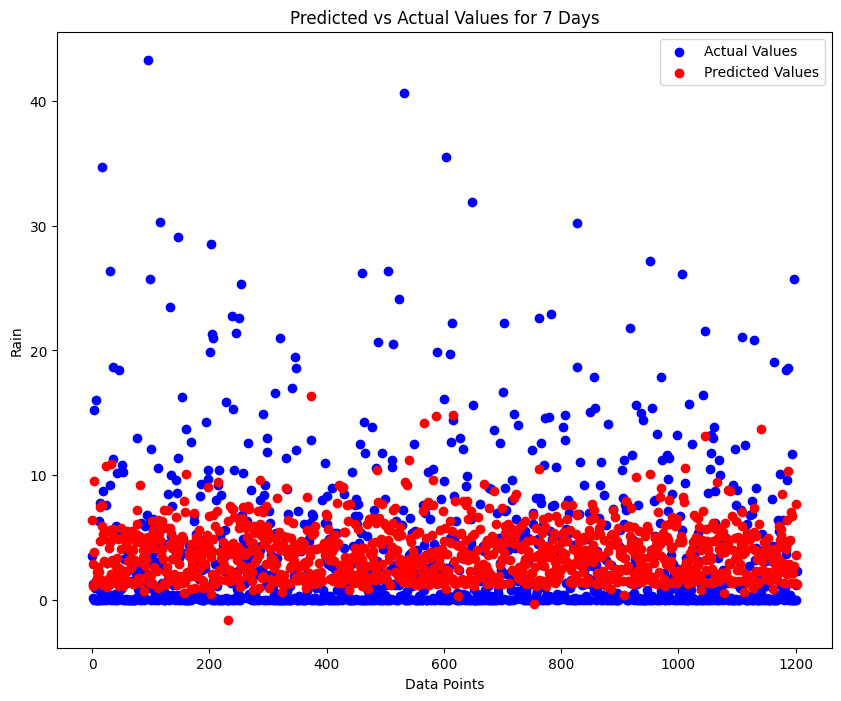


Training and evaluating model with 14 days of previous rain data:
Epoch 1/1200
88/88 [==============================] - 1s 2ms/step - loss: 32.1441
Epoch 2/1200
88/88 [==============================] - 0s 3ms/step - loss: 27.0162
Epoch 3/1200
88/88 [==============================] - 0s 3ms/step - loss: 26.4242
Epoch 4/1200
88/88 [==============================] - 0s 2ms/step - loss: 26.3709
Epoch 5/1200
88/88 [==============================] - 0s 2ms/step - loss: 25.9731
Epoch 6/1200
88/88 [==============================] - 0s 2ms/step - loss: 25.8322
Epoch 7/1200
88/88 [==============================] - 0s 2ms/step - loss: 25.7516
Epoch 8/1200
88/88 [==============================] - 0s 2ms/step - loss: 25.9040
Epoch 9/1200
88/88 [==============================] - 0s 4ms/step - loss: 25.7860
Epoch 10/1200
88/88 [==============================] - 0s 2ms/step - loss: 25.7291
Epoch 11/1200
88/88 [==============================] - 0s 3ms/step - loss: 25.3727
Epoch 12/1200
88/88 [========

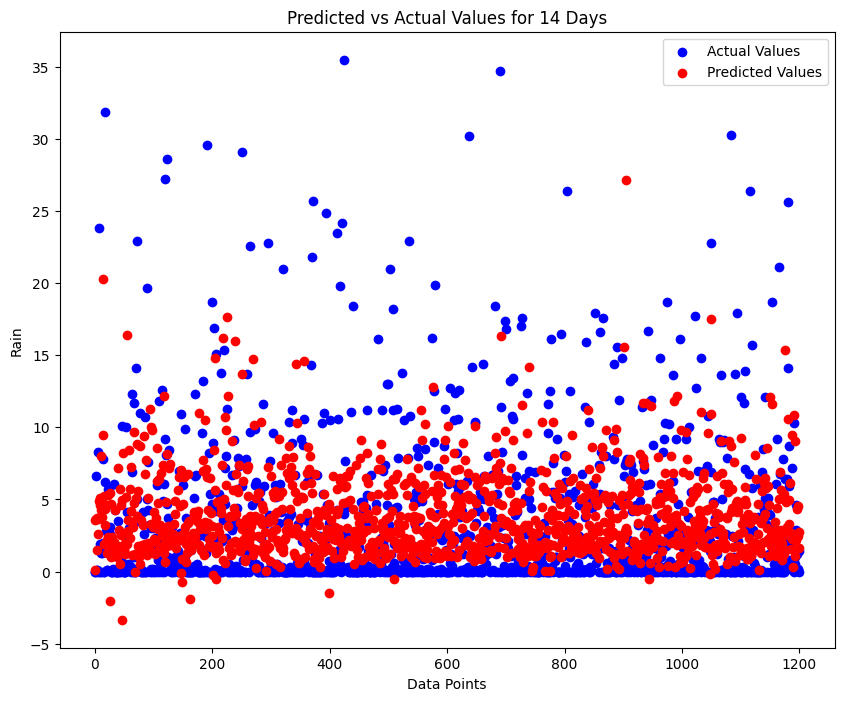


Training and evaluating model with 21 days of previous rain data:
Epoch 1/1200
88/88 [==============================] - 2s 3ms/step - loss: 32.2348
Epoch 2/1200
88/88 [==============================] - 0s 3ms/step - loss: 26.2585
Epoch 3/1200
88/88 [==============================] - 0s 3ms/step - loss: 25.8047
Epoch 4/1200
88/88 [==============================] - 0s 3ms/step - loss: 25.3586
Epoch 5/1200
88/88 [==============================] - 0s 3ms/step - loss: 25.1284
Epoch 6/1200
88/88 [==============================] - 0s 4ms/step - loss: 25.2284
Epoch 7/1200
88/88 [==============================] - 0s 3ms/step - loss: 25.1529
Epoch 8/1200
88/88 [==============================] - 0s 3ms/step - loss: 25.0186
Epoch 9/1200
88/88 [==============================] - 0s 3ms/step - loss: 25.0481
Epoch 10/1200
88/88 [==============================] - 0s 3ms/step - loss: 24.8581
Epoch 11/1200
88/88 [==============================] - 0s 3ms/step - loss: 24.9951
Epoch 12/1200
88/88 [========

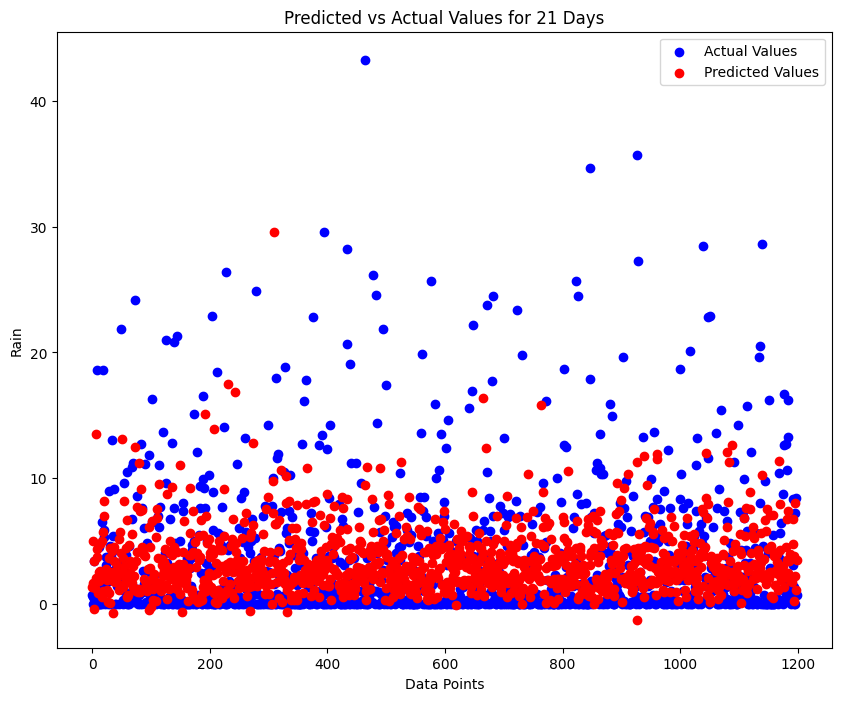


Training and evaluating model with 28 days of previous rain data:
Epoch 1/1200
88/88 [==============================] - 1s 2ms/step - loss: 32.1459
Epoch 2/1200
88/88 [==============================] - 0s 2ms/step - loss: 27.3992
Epoch 3/1200
88/88 [==============================] - 0s 4ms/step - loss: 26.8094
Epoch 4/1200
88/88 [==============================] - 0s 4ms/step - loss: 26.4527
Epoch 5/1200
88/88 [==============================] - 0s 3ms/step - loss: 26.4229
Epoch 6/1200
88/88 [==============================] - 0s 2ms/step - loss: 26.2279
Epoch 7/1200
88/88 [==============================] - 0s 1ms/step - loss: 26.4207
Epoch 8/1200
88/88 [==============================] - 0s 2ms/step - loss: 25.9577
Epoch 9/1200
88/88 [==============================] - 0s 2ms/step - loss: 25.7904
Epoch 10/1200
88/88 [==============================] - 0s 2ms/step - loss: 25.8483
Epoch 11/1200
88/88 [==============================] - 0s 2ms/step - loss: 25.8949
Epoch 12/1200
88/88 [========

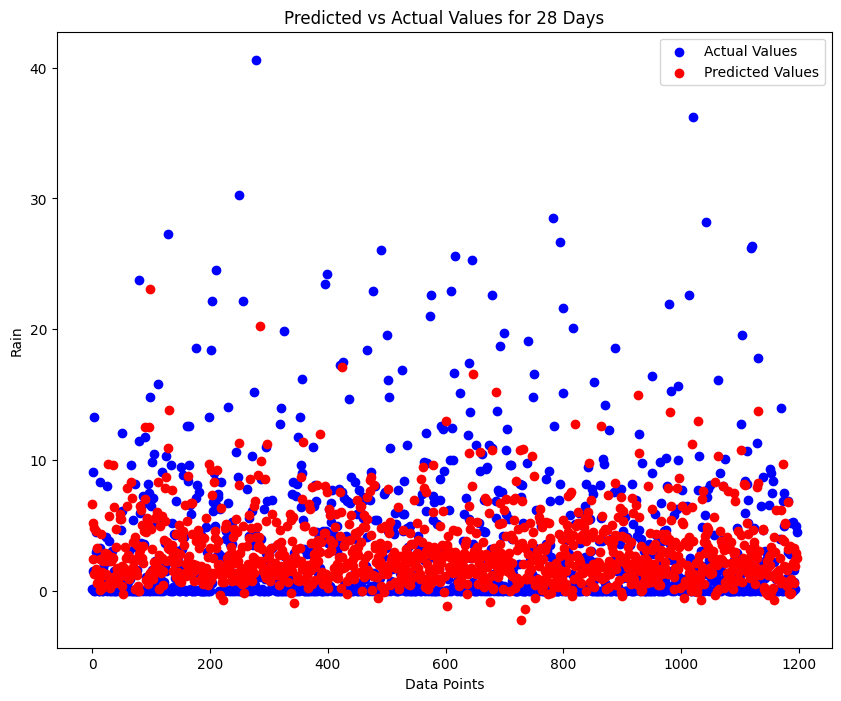

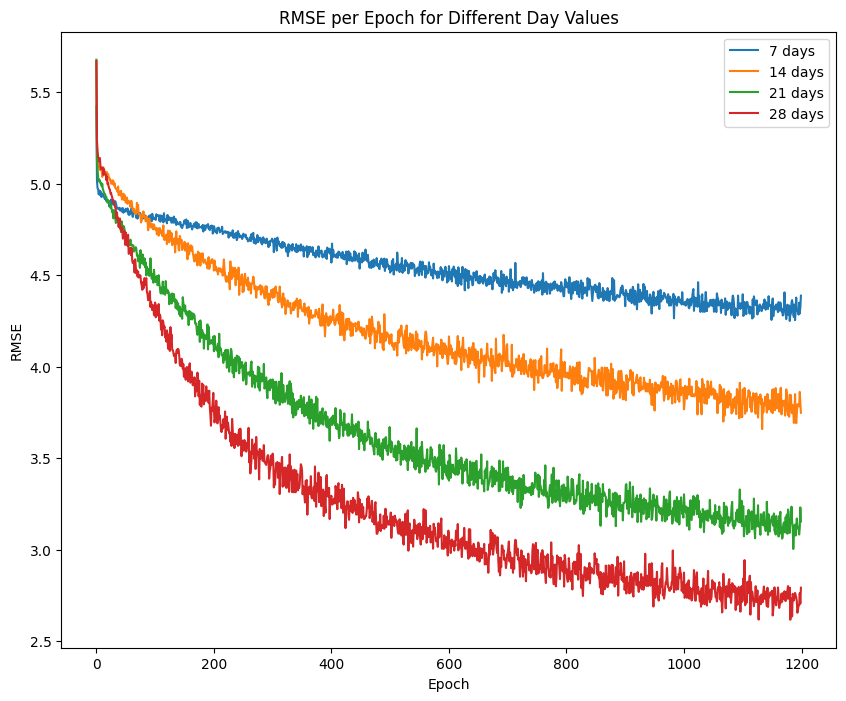

In [20]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
import matplotlib.pyplot as plt

# Initialize a dictionary to store RMSE values for each 'days' value
rmse_per_epoch_per_days = {}

def train_and_evaluate_model(days):
    # Step 1: Prepare the Data
    # Create rain_previous_day columns
    for i in range(1, days+1):
        county_galway[f'rain_previous_day_{i}'] = county_galway['rain'].shift(i)

    # Extract relevant features and target variable
    features = [f'rain_previous_day_{i}' for i in range(1, days+1)] + ['date']
    target = 'rain'
    data = county_galway[features + [target]].copy()

    # Convert date to ordinal
    data['date'] = pd.to_datetime(data['date']).apply(lambda x: x.toordinal())

    # Drop rows with missing values
    data.dropna(inplace=True)

    # Step 2: Split the Data
    X = data[features]
    y = data[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

    # Scale the data
    scaler = MinMaxScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Step 3: Build the Neural Network Model
    model = Sequential()
    model.add(Dense(64, activation='relu', input_shape=(X_train.shape[1],)))
    model.add(Dropout(0.2))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(1))

    model.compile(loss='mean_squared_error', optimizer='adam')

    # Step 4: Train the Model
    history = model.fit(X_train, y_train, epochs=1200, batch_size=32, verbose=1)

    # Step 5: Evaluate the Model
    y_pred = model.predict(X_test)
    mse = tf.keras.losses.mean_squared_error(y_test, y_pred)
    rmse = tf.sqrt(mse)

    # Store RMSE values for each epoch in the dictionary
    rmse_per_epoch_per_days[days] = np.sqrt(history.history['loss'])

    plt.figure(figsize=(10, 8))
    plt.scatter(range(len(y_test)), y_test, color='blue', label='Actual Values')
    plt.scatter(range(len(y_pred)), y_pred, color='red', label='Predicted Values')
    plt.title(f'Predicted vs Actual Values for {days} Days')
    plt.xlabel('Data Points')
    plt.ylabel('Rain')
    plt.legend()
    plt.show()
# Define a function to plot all RMSE values
def plot_rmse(rmse_per_epoch_per_days):
    plt.figure(figsize=(10, 8))
    for days, rmse_values in rmse_per_epoch_per_days.items():
        plt.plot(rmse_values, label=f'{days} days')

    plt.title('RMSE per Epoch for Different Day Values')
    plt.xlabel('Epoch')
    plt.ylabel('RMSE')
    plt.legend()
    plt.show()

# Assuming 'county_clare' is your DataFrame with the necessary data
# Test the function with different numbers of days
for days in [7,14,21,28]:
    print(f"\nTraining and evaluating model with {days} days of previous rain data:")
    train_and_evaluate_model(days)

# After all models are trained, plot the RMSE values
plot_rmse(rmse_per_epoch_per_days)

